# Importando as bibliotecas

In [1]:
# Manipulação de dados
import pandas as pd
import numpy as np

# Gráficos
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
import plotly.graph_objs as go
import plotly.offline as py

sns.set()

# Aprendizagem de Máquina (Datasest)
from sklearn import datasets

# Removendo advertencias
import warnings
warnings.filterwarnings('ignore')

C:\Users\mcdc\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Importando os dados

In [2]:
df = sns.load_dataset('fmri')
df

,subject,timepoint,event,region,signal
0,s13,18,stim,parietal,-0.017552
1,s5,14,stim,parietal,-0.080883
2,s12,18,stim,parietal,-0.081033
3,s11,18,stim,parietal,-0.046134
4,s10,18,stim,parietal,-0.037970
...,...,...,...,...,...
1059,s0,8,cue,frontal,0.018165
1060,s13,7,cue,frontal,-0.029130
1061,s12,7,cue,frontal,-0.004939
1062,s11,7,cue,frontal,-0.025367


In [3]:
# Carregando o dataset das casas de boston
boston = datasets.load_boston()
boston.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

# Realizando a análise exploratória dos dados

In [4]:
# Verificando o formato dos dados
boston.data.shape

(506, 13)

In [5]:
# Verificando o nome das colunas do dataset
boston.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

In [6]:
# Verificando a descrição do dataset
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

### Descrição das variáveis
- CRIM: Taxa de criminalidade per capita por cidade
- ZN: Proporção de terrenos residenciais divididos em lotes com mais de 25.000 pés quadrados.
- INDUS: Proporção de acres comerciais não comerciais por cidade
- CHAS: Variável fictícia  Charles River (= 1 se o trecho limita o rio; 0 caso contrário)
- NOX: concentração de óxidos nítricos  (partes por 10 milhões)
- RM: número médio de quartos por habitação
- AGE: Proporção de unidades ocupadas pelos proprietários construídas antes de 1940
- DIS: Distâncias ponderadas para os cinco centros de emprego em Boston
- RAD: Índice de acessibilidade às rodovias radiais
- TAX: Taxa de imposto sobre a propriedade de valor total por US10.000
- PTRATIO: Proporção aluno-professor por cidade
- B:  1000 (Bk - 0,63) ^ 2 onde Bk é a proporção de negros por cidade
- LSTAT: menor status da população
- MEDV (Target): Valor médio  das casas ocupadas pelos proprietários em US$1000

## Hipóteses a serem comprovadas:
1) Com relação a taxa de criminalidade:
    - Há relação entre a taxa ['CRIM'] e a proporção de negros ['B']
    - Há relação entre a taxa ['CRIM'] e o status da população ['LSTAT'] ?
    - Há´relação entre a taxa ['CRIM'] e o valor médio das casas ?

2) Com relação ao CHAS:
    - Há relação entre o ['CHAS'] e o preço médio das casas ['MEDV'] ? 

3) Com relação ao NOX:
    - Qual a distribuição da concentração de NOX ?
    - Qual a relação entre a distribuição de NOX e o preço médio das casas ?

4) Com relação ao RM:
    - Qual a distribuição da quantidade média de quartos ['RM']
    - Há relação enre a quantidade de quartos ['RM'] e o preço médio das casas ['MEDV']
    
5) Com relação a idade ['AGE']:
    - Qual a distribuição de idade das casas na cidade de boston ?
    - Há alguma correlação entre a idade e alguma taxa ?
    - O preço médio se altera conforme a idade ?
    - A taxa de imposto se altera conforme a idade ?
    - As casas mais velhas ficam mais próximas ao centro ['DIS'] ?

6) Com relação a TAX:
    - Há relação entre a taxa ['TAX'] e o valor médio das casas ['MEDV']?

7) Com relação ao PTRATIO:
    - Há relação entre o ['PTRATIO'] e o status ['LSTAT'] da população ?

In [7]:
# Verificando as variáveis preditoras e adicionando a coluna
X = pd.DataFrame(boston.data, columns=boston.feature_names)
X

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


In [8]:
print(X['RAD'].value_counts())
print('\t')
print(X['ZN'].value_counts())
print('\t')
print(X['CHAS'].value_counts())
print('\t')
print(X['PTRATIO'].value_counts())

24.0    132
5.0     115
4.0     110
3.0      38
6.0      26
8.0      24
2.0      24
1.0      20
7.0      17
Name: RAD, dtype: int64
	
0.0      372
20.0      21
80.0      15
12.5      10
22.0      10
25.0      10
40.0       7
45.0       6
30.0       6
90.0       5
21.0       4
95.0       4
60.0       4
33.0       4
75.0       3
35.0       3
28.0       3
55.0       3
52.5       3
70.0       3
34.0       3
85.0       2
82.5       2
17.5       1
100.0      1
18.0       1
Name: ZN, dtype: int64
	
0.0    471
1.0     35
Name: CHAS, dtype: int64
	
20.2    140
14.7     34
21.0     27
17.8     23
19.2     19
17.4     18
18.6     17
19.1     17
16.6     16
18.4     16
21.2     15
15.2     13
13.0     12
20.9     11
17.9     11
18.7      9
19.7      8
19.6      8
17.6      7
16.4      6
18.0      5
16.0      5
20.1      5
16.1      5
16.9      5
16.8      4
14.9      4
19.0      4
18.5      4
17.0      4
18.2      4
18.3      4
12.6      3
14.8      3
18.9      3
15.3      3
15.9      2
22.0      

In [9]:
# Verificando as variáveis targets
y = pd.DataFrame(boston.target, columns=['MEDV'])
y

,MEDV
0,24.0
1,21.6
2,34.7
3,33.4
4,36.2
...,...
501,22.4
502,20.6
503,23.9
504,22.0


In [10]:
# Unindo as tabelas
X['MEDV'] = y['MEDV']
X

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


In [11]:
# Verificando os valores missings das variáveis preditoras (X)
X.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

In [12]:
# Verificando os valores missings da variável target (y)
y.isnull().sum()

MEDV    0
dtype: int64

# Realizando o EDA dos dados

### Descrição dos dados

In [53]:
X.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,NIVEL_CASA_CAT
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806,0.994071
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104,0.814451
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000,0.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000,0.000000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000,1.000000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000,2.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000,2.000000


In [54]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   CRIM            506 non-null    float64 
 1   ZN              506 non-null    float64 
 2   INDUS           506 non-null    float64 
 3   CHAS            506 non-null    float64 
 4   NOX             506 non-null    float64 
 5   RM              506 non-null    float64 
 6   AGE             506 non-null    float64 
 7   DIS             506 non-null    float64 
 8   RAD             506 non-null    float64 
 9   TAX             506 non-null    float64 
 10  PTRATIO         506 non-null    float64 
 11  B               506 non-null    float64 
 12  LSTAT           506 non-null    float64 
 13  MEDV            506 non-null    float64 
 14  NIVEL_CASA      506 non-null    category
 15  NIVEL_CASA_CAT  506 non-null    int32   
dtypes: category(1), float64(14), int32(1)
memory usage: 58.1 KB


### Análise com o Pandas Profilling

In [58]:
import pandas_profiling
pandas_profiling.ProfileReport(X.drop(['NIVEL_CASA_CAT'], axis=1))

### Outliers:
Os outiliers são valores que podem estar longe da distribuição normal de alguns dados, tratando-se portanto de valores que podem gerar interpretações erradas dos gráficos

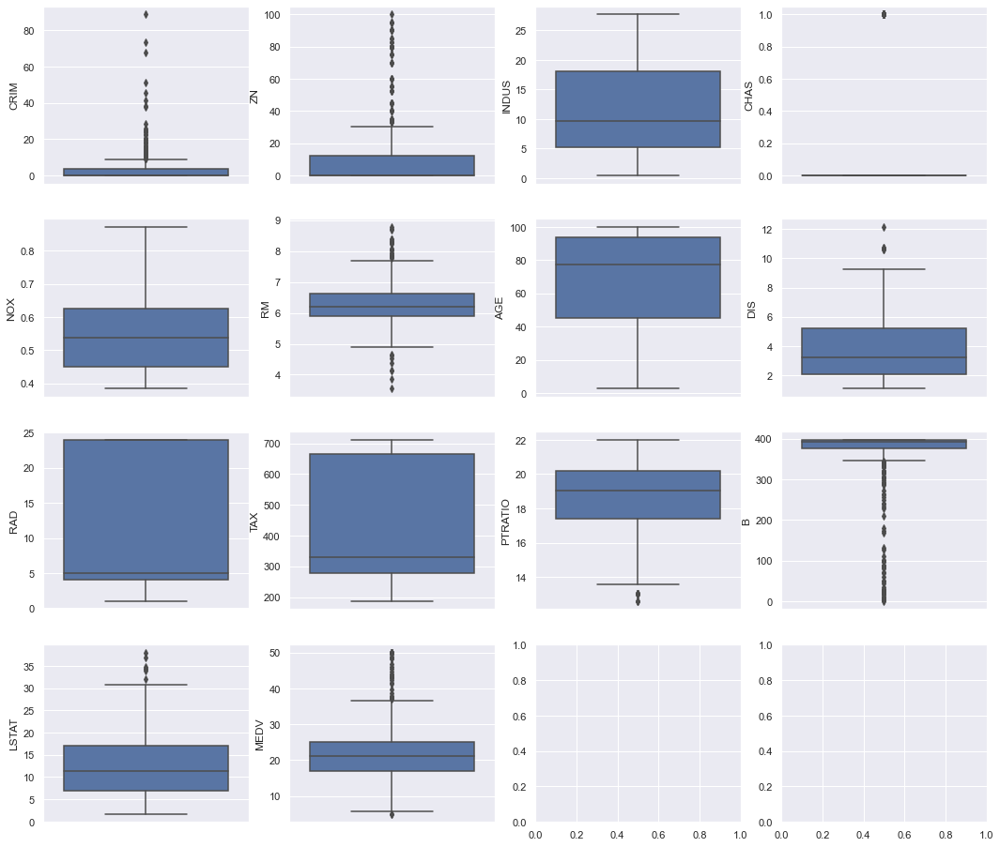

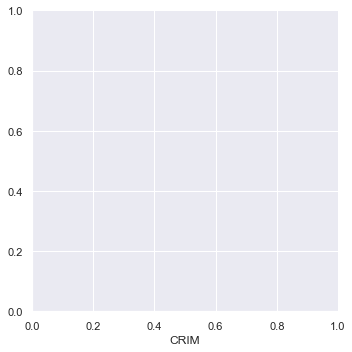

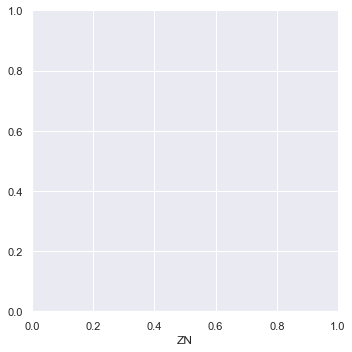

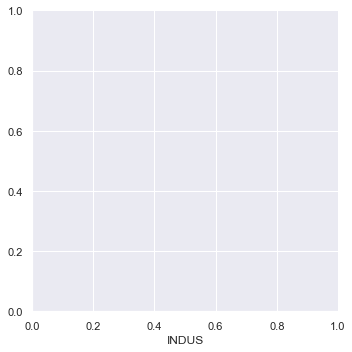

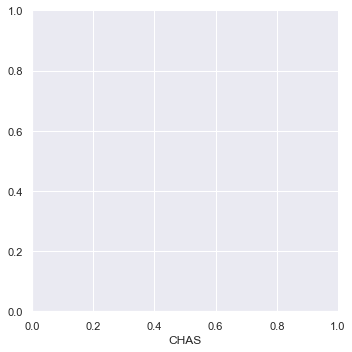

...

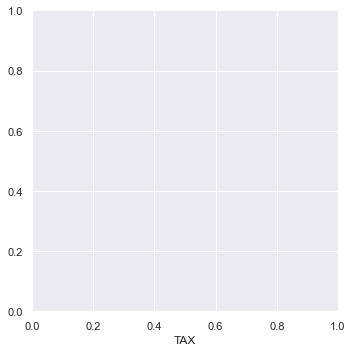

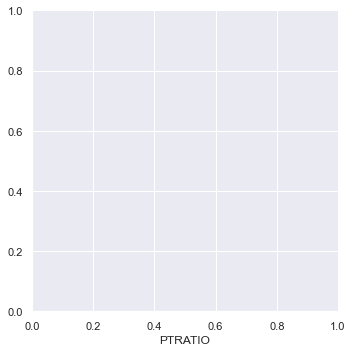

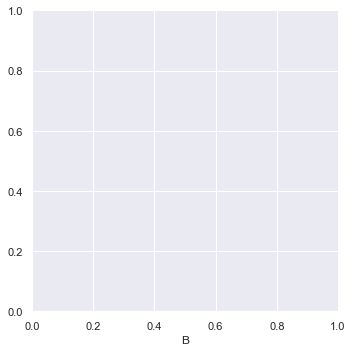

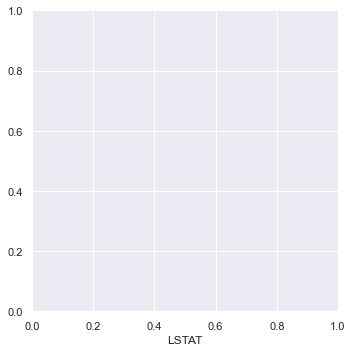

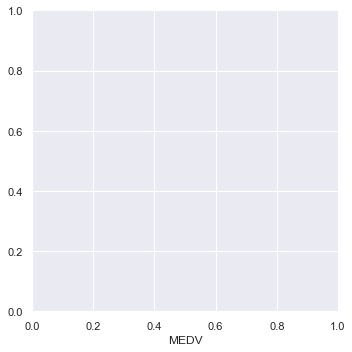

In [13]:
# Verificando outliers nos dados
figure, ax = plt.subplots(4, 4, figsize=(18,16))
a = 0
b = 0

for col in X:
    if b == 4:
        b = 0
        a = a+1
    figure = sns.catplot(x=col, kind='box', orient='v', data=X, ax = ax[a,b])
    b = b+1    

In [14]:
# Verificando as maiores dispersões com o plotly

# Gráfico boxplot p/ o índice de Criminalidade
trace1 = go.Box(y=X['CRIM'], name='CRIM', marker={'color': '#f39c12'}) 

# Gráfico boxplot p/ ZN
trace2 = go.Box(y=X['ZN'], name='ZN', marker={'color': '#e67e22'})

# Gráfico boxplot p/ o número de quartos RN
trace3 = go.Box(y=X['RM'], name='RM', marker={'color': '#d35400'})

# Gráfico com a proporção de negros B
trace4 = go.Box(y=X['B'], name='B', marker={'color': '#e74c3c'})

# Carregando os dados em uma lista
data = [trace1, trace2, trace3, trace4]

# Carregando o Layout 
layout = go.Layout(title= 'Disperção dos Maiores Valores',
                   titlefont = {'family': 'Arial',
                                'size': 22,
                                'color': '#7f7f7f'},
                   )

# Atribuindo os valores da figura
fig = go.Figure(data=data, layout=layout)

py.iplot(fig)

### Distribuição dos Valores da Média de Casas

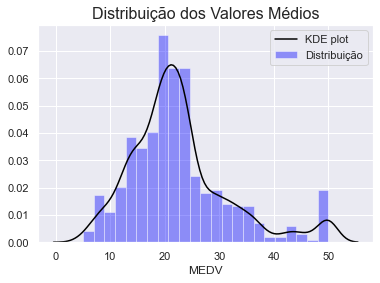

In [15]:
# Distribuição dos valores médios das casas
plt.title('Distribuição dos Valores Médios', size=16)
fig = sns.distplot(X['MEDV'], color = 'g',
                  kde_kws = {'color': 'black', 'label': 'KDE plot'},
                  hist_kws = {'color':'blue', 'label':'Distribuição'})

In [52]:
# Verificando o Valor das Casas x Idade
# Criando o gráfico
trace = go.Scatter(x=X['MEDV'],
                   y = X['AGE'],
                   mode='markers',
                   marker = {'color': '#e74c3c',
                             'line': {'width': 1, 
                                      'color': '#c0392b'}},
                   opacity = 0.8
                   )
# Carregando o trace em data
data = [trace]

# Criando Layout
layout = go.Layout(title={'text':'Preço Médio x Ano de Construção'},
                   xaxis={'title': 'Preço da Casa'},
                   yaxis={'title': 'Ano de Construção'},)

# Criando a figura que será exibida
fig = go.Figure(data=data, layout=layout)

# Plotando o gráfico
py.iplot(fig)

### Verificando a correlação entre as variáveis :

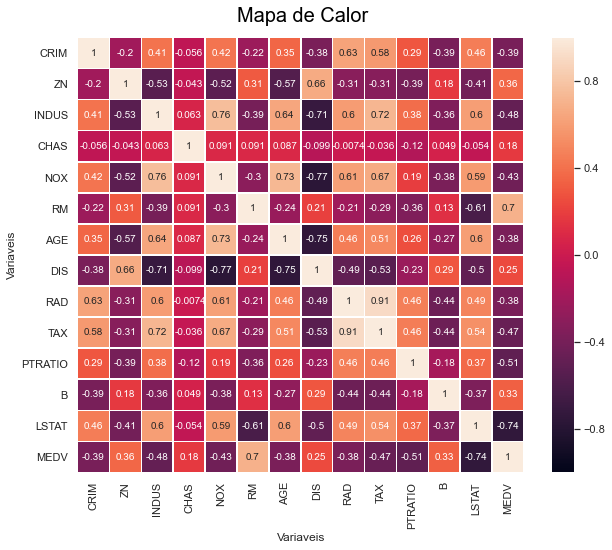

In [16]:
f, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(X.corr(), vmin=-1, vmax=1, annot=True, linewidths=.5)
plt.xlabel('Variaveis')
plt.ylabel('Variaveis')
plt.text(5, -0.5, 'Mapa de Calor', fontsize=20, color='Black')

# Salvando a figura
ax.get_figure().savefig('C:/PythonSUDS/teste_01/figures/heatmap.png')

#### Do mapa de correlação é possível concluir que NEGATIVAMENTE:
- há uma alta correlação negativa entre a distância até o centro e a taxa de zona industrial
- Há uma alta correlação negativa entre a distância e o NOX do terreno
- E uma taxa de correlação negativa alta entre a distância e a idade das casas
- Entre o NOX e a ZN
- Entre a Idade e a ZN
- O status LSTAT  e o RM;</br>

• Confirmando as correlações com um factorplot que revela a correlação entre as variáveis:

In [18]:
# Dividino a variável Target em 3 categorias (Alto, média e baixo valor)
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()

X['NIVEL_CASA'] = pd.qcut(X['MEDV'], 3)
X['NIVEL_CASA_CAT'] = label.fit_transform(X['NIVEL_CASA']).astype(int)
#X['NIVEL_CASA_CAT'].values_counts()
X

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,NIVEL_CASA,NIVEL_CASA_CAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0,"(23.7, 50.0]",2
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6,"(18.833, 23.7]",1
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7,"(23.7, 50.0]",2
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4,"(23.7, 50.0]",2
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2,"(23.7, 50.0]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4,"(18.833, 23.7]",1
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6,"(18.833, 23.7]",1
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9,"(23.7, 50.0]",2
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0,"(18.833, 23.7]",1


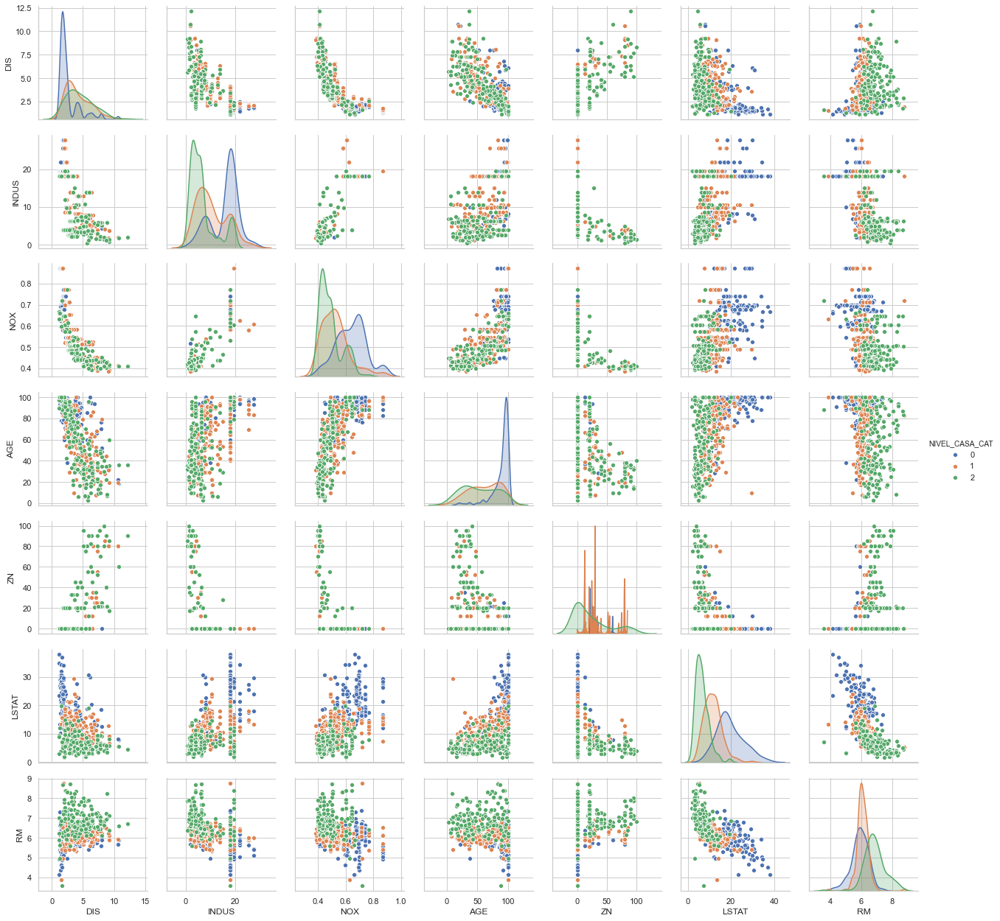

In [19]:
# Pairplots de correlação negativa
X_neg = X[['DIS', 'INDUS', 'NOX', 'AGE', 'ZN', 'LSTAT', 'RM', 'NIVEL_CASA_CAT']]
sns.set_style("whitegrid")
sns.pairplot(X_neg, hue='NIVEL_CASA_CAT',
             x_vars=['DIS', 'INDUS', 'NOX', 'AGE', 'ZN', 'LSTAT', 'RM'],
             y_vars=['DIS', 'INDUS', 'NOX', 'AGE', 'ZN', 'LSTAT', 'RM'])

Dos fatores observados é possível concluir que:
- Quanto menor a concentração de NOX na terra ['NOX'], maior a distância ['DIS'];
- Propriedades com status percentual inferior da população ['LSTAT'] maior e baixa distância até os centros de emprego ['DIS'] são as casas com nível 0;
- Propriedades com menos quartos ['RM'] se localizam mais próximas aos centros de emprego ['DIS'];
- Propriedades nível 0 com status percentual inferior da população ['LSTAT'] maior possuem, em geral, menor numero de quartos ['RM'];
- Propriedades nível 0 com status percentual inferior da população ['LSTAT'] maior possuem, em geral, um proporção de unidades ocupadas pelo proprietário construídas mais antigas ['AGE'];
- A taxa de industrias ['INDUS'] diminuiem conforme a distância ['DIS'], mas aumenta conforme o ['NOX'];

#### É possível observar uma correlação POSITIVA em :
- NOX na terra e a INDUS;
- Entre a idade AGE e o NOX da terra;
- Entre a idade AGE e a industria INDUS;
- Entre a taxa TAX e a industria INDUS;
- Entre a TAX e a RAD
• Confirmando as correlações com o factorplot:

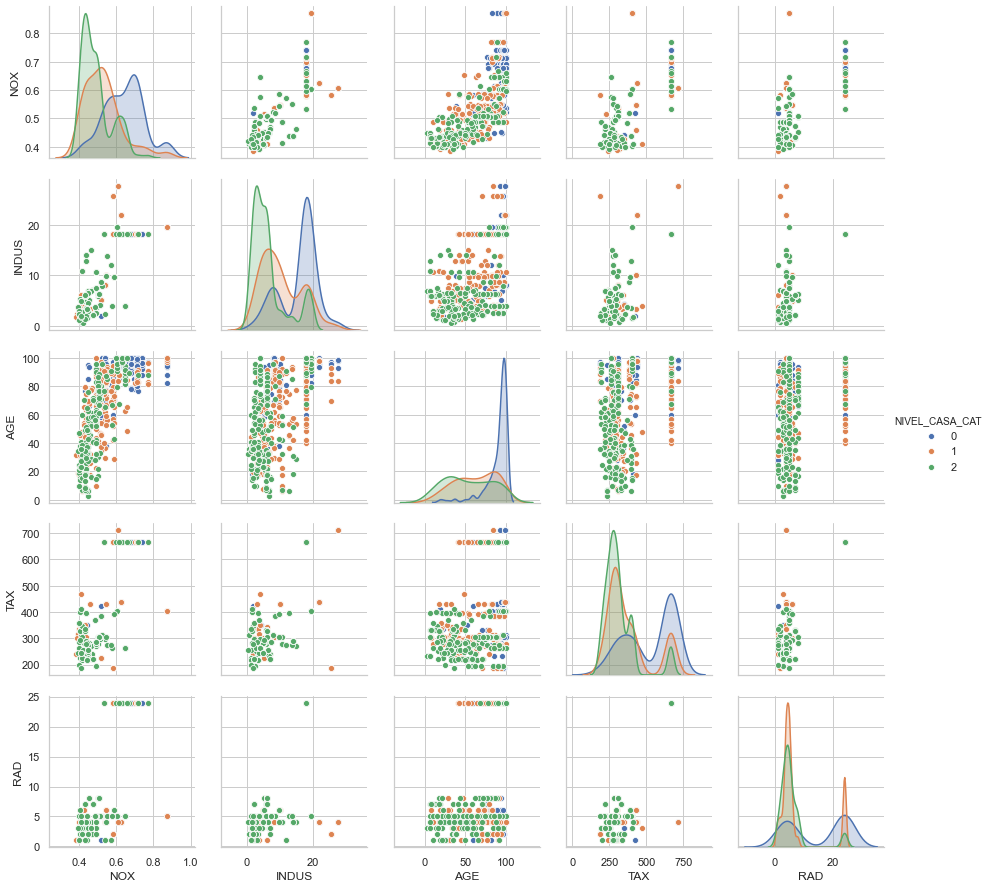

In [20]:
# Pairplots de correlação positiva
X_pos = X[['NOX', 'INDUS', 'AGE', 'TAX', 'RAD', 'NIVEL_CASA_CAT']]
sns.set_style("whitegrid")
sns.pairplot(X_pos, hue='NIVEL_CASA_CAT',
             x_vars=['NOX', 'INDUS', 'AGE', 'TAX', 'RAD'],
             y_vars=['NOX', 'INDUS', 'AGE', 'TAX', 'RAD'])

Dos fatores observador é possível observar que:
- Locais de nível 2 são comuns em praticamente qualquer idade de construção ['AGE'];
- Locais de nível 2 também são comuns em praticamente qualquer taxa industrial ['INDUS'];
- O nível de NOX é maior em casas mais velhas ['AGE']

# Análisando as variáveis separadamente

### Análisando a variável CRIM
- Há relação entre a taxa ['CRIM'] e a proporção de negros ['B'] ?
- Há relação entre a taxa ['CRIM'] e o status da população ['LSTAT'] ?
- Há´relação entre a taxa ['CRIM'] e o valor médio das casas ?

In [21]:
print(X['B'].value_counts())
print('\t')
print(X['B'].unique)

396.90    121
395.24      3
393.74      3
393.23      2
394.72      2
         ... 
394.46      1
288.99      1
390.30      1
248.31      1
390.50      1
Name: B, Length: 357, dtype: int64
	
<bound method Series.unique of 0      396.90
1      396.90
2      392.83
3      394.63
4      396.90
        ...  
501    391.99
502    396.90
503    396.90
504    393.45
505    396.90
Name: B, Length: 506, dtype: float64>


#### Distribuição

(-5.0, 30.0)

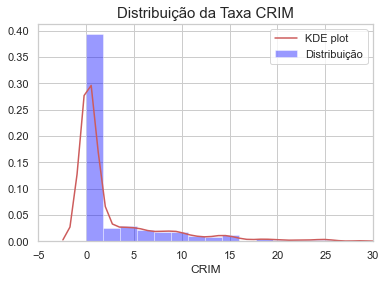

In [22]:
# Definindo o estilo dos plots
sns.set_style("whitegrid")

# Plotando o gráfico entre o CRIM x B
fig = sns.distplot(X['CRIM'],
                  kde_kws = {'color': 'indianred', 'label': 'KDE plot'},
                  hist_kws = {'color':'blue', 'label':'Distribuição'})
plt.title('Distribuição da Taxa CRIM', size=15)
plt.xlim(-5, 30)

#### Correlação

Text(0.5, 1.0, 'Valor Médio das Casas x Criminalidade')

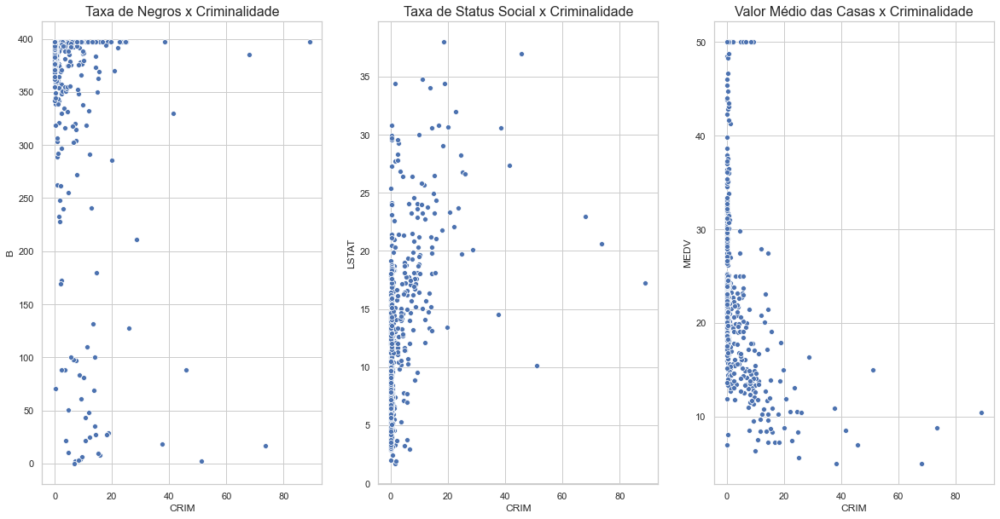

In [23]:
# Definindo o estilo dos plots
sns.set_style("whitegrid")

# Declarando os subplots
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))

# Plotando o gráfico entre o CRIM x B
cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)
fig = sns.scatterplot(x='CRIM', y='B', data=X, ax=ax1, palette=cmap)
ax1.set_title('Taxa de Negros x Criminalidade', fontdict={'size':16})

# Plotando o gráfico entre o CRIM x LSTAT
fig = sns.scatterplot(x='CRIM', y='LSTAT', data=X, ax=ax2)
ax2.set_title('Taxa de Status Social x Criminalidade', fontdict={'size':16})

# Plotando o gráfico entre o CRIM x MEDV
fig = sns.scatterplot(x='CRIM', y='MEDV', data=X, ax=ax3)
ax3.set_title('Valor Médio das Casas x Criminalidade', fontdict={'size':16})

- Não é possível concluir que há um aumento da criminalidade conforme a taxa de negros;
- A taxa de criminalidade per capita por cidade é predominantemente baixa em qualquer LSTAT;
- Há uma leve correlação (-0.39) entre a criminalidade e a média do preço das residencias.

### Analisando a variável CHAS
- Há relação entre o ['CHAS'] e o preço médio das casas ['MEDV'] ? 

Text(0.5, 1.0, 'Relação entre o ["CHAS"] x a Média do valor da área ["MEDV"]')

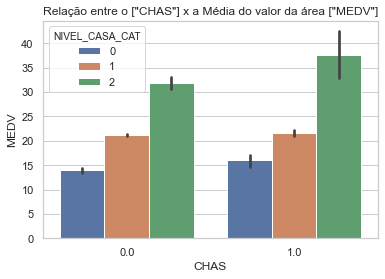

In [24]:
sns.barplot(X['CHAS'], X['MEDV'], hue=X['NIVEL_CASA_CAT'])
plt.title('Relação entre o ["CHAS"] x a Média do valor da área ["MEDV"]')

• Há relação entre áreas que limitam rios ['CHAS'] e a quantidade de quartos ['RM'] ?

Text(0.5, 1.0, 'Relação entre o ["CHAS"] x Num. de Quartos ["RM"]')

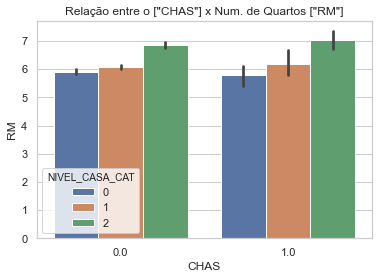

In [25]:
sns.barplot(X['CHAS'], X['RM'], hue=X['NIVEL_CASA_CAT'])
plt.title('Relação entre o ["CHAS"] x Num. de Quartos ["RM"]')

• Áreas que limitam o rio ['CHAS'] geralmente são mais caras; </p>
• É possível afirmar que áreas que limitam o rio são geralmente casas de nível 2; </p>

• É possivel afirmar que em relação a áreas que não limitam o rio, as áreas que limitam o rio possuem geralmente um número maior de quartos.

### Analisando a variável NOX
- Qual a distribuição da concentração de NOX ?
- Qual a relação entre a distribuição de NOX e o preço médio das casas ?

Text(0.5, 1.0, 'Distribuição de NOX')

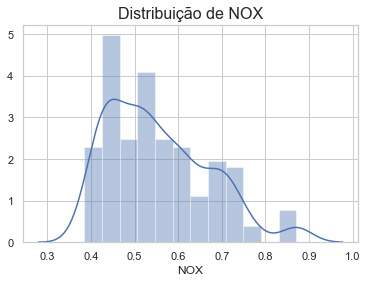

In [26]:
# Gráfico de Distrubuição
sns.distplot(X['NOX'])
plt.title('Distribuição de NOX', size=16)

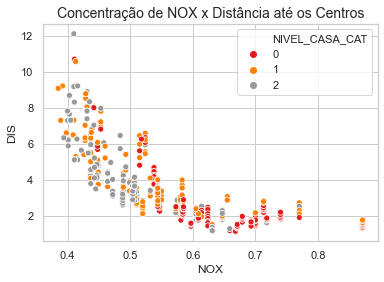

In [27]:
sns.scatterplot(X['NOX'], X['DIS'], hue=X['NIVEL_CASA_CAT'], palette='Set1')
fig = plt.title('Concentração de NOX x Distância até os Centros', size=14)

- É possível concluir pela distribuição que a maior concentração de NOX é entre 0.4 e 0.6
- Conforme a d
istância até os centros diminui a quantidade de NOX na terra aumenta.

### Analisando a variável RM:
- Qual a distribuição da quantidade média de quartos ['RM'];
- Há relação enre a quantidade de quartos ['RM'] e o preço médio das casas ['MEDV'].

Text(0.5, 1.0, 'Distribuição dos Quartos')

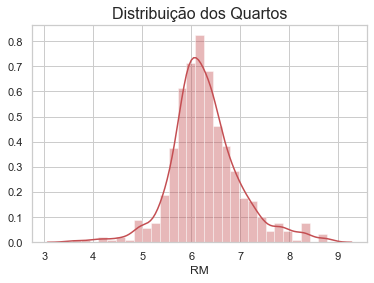

In [28]:
# Distribuição no número de quartos
sns.distplot(X['RM'], color='r')
plt.title('Distribuição dos Quartos', size=16)

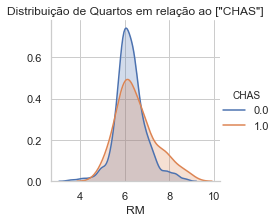

In [29]:
# Comparando o numero de quartos com as áreas limitadas a rio.
fig = sns.FacetGrid(X, hue='CHAS')
fig.map(sns.kdeplot, 'RM', shade=True)
fig.add_legend()
plt.title('Distribuição de Quartos em relação ao ["CHAS"]')
plt.show()

In [30]:
import plotly.express as px

fig = px.scatter(X, x='LSTAT', y = 'RM', color='NIVEL_CASA_CAT', facet_col='NIVEL_CASA_CAT')
fig.update_layout(title_text='Distribuição de Quartos por Nível Social', title_font_size=20)
fig.show()

Text(0.5, 1.0, 'Valor Médio das Casas x Qnt. de Quartos')

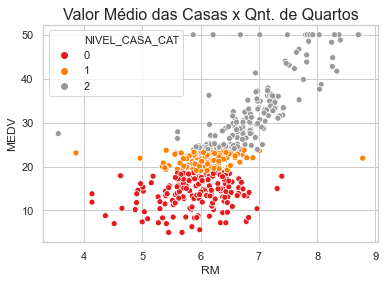

In [31]:
# Comparando o preço das casas com a quantidade de quartos
sns.scatterplot(X['RM'], X['MEDV'], hue=X['NIVEL_CASA_CAT'], palette='Set1')
plt.title('Valor Médio das Casas x Qnt. de Quartos', size=16)

- É possível concluir que a maioria das casas possuem entre 6 e 7 quartos, e que as casas que não possuem áreas limitadas por rios possui maior incidência.
- Casas de nível 2, possuem em geral mais quartos (acima de 6), e possuem um valor médio maior.

### Analisando a variável AGE:

- Qual a distribuição de idade das casas na cidade de boston ?
- Há alguma correlação entre a idade e alguma taxa ?
- O preço médio se altera conforme a idade ?
- A taxa de imposto se altera conforme a idade ?
- As casas mais velhas ficam mais próximas ao centro ['DIS'] ?

Text(0.5, 0, 'Idade')

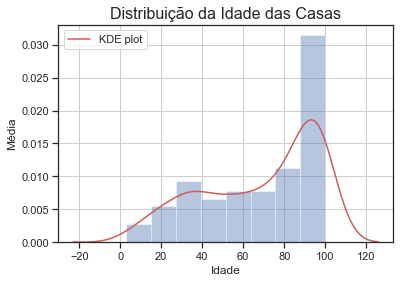

In [36]:
# Distribuição de idade das casas
#sns.set_style('whitegrid')
sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
sns.distplot(X['AGE'], kde_kws = {'color': 'indianred', 'label': 'KDE plot'})
plt.title('Distribuição da Idade das Casas', size=16)
plt.grid(True)
plt.ylabel('Média')
plt.xlabel('Idade')

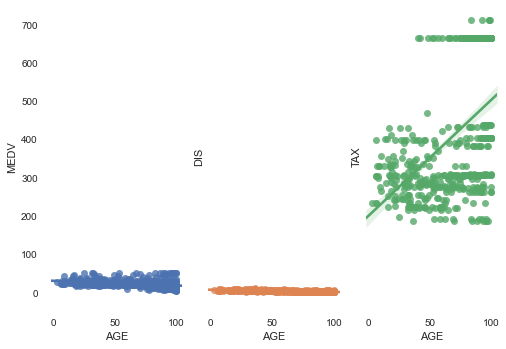

In [113]:
# Analisando com gráficos juntos
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharey=True)
sns.regplot(x=X['AGE'], y=X['MEDV'], ax=ax1)
sns.regplot(x=X['AGE'], y=X['DIS'], ax=ax2)
sns.regplot(x=X['AGE'], y=X['TAX'], ax=ax3)

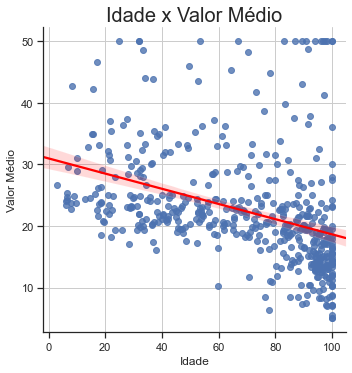

In [51]:
# Analisando a relação entre a idade da casa e o valor medio
fig = sns.lmplot('AGE', 'MEDV', data=X, line_kws={'color': 'red'})
plt.xlabel('Idade')
plt.ylabel('Valor Médio')
plt.title('Idade x Valor Médio', size=20)
plt.grid(True)

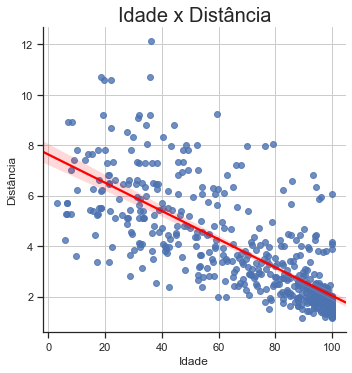

In [50]:
# Analisando a relação entre a idade da casa e a distância
fig = sns.lmplot('AGE', 'DIS', data=X, line_kws={'color': 'red'})
plt.xlabel('Idade')
plt.ylabel('Distância')
plt.title('Idade x Distância', size=20)
plt.grid(True)

- É possível verificar que o preço médio das casas é maior em casas com mais de 100 anos;
- O valor médio das casas bem com a distância entre a até os centros de emprego vão diminuindo conforme o aumento da idade.

### Analisando a variável TAX

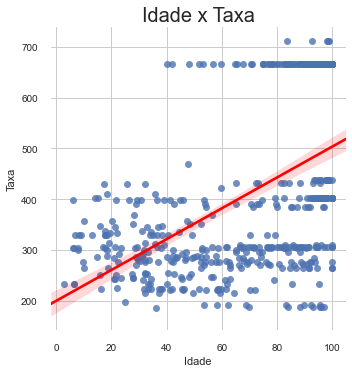

In [59]:
# Analisando a relação entre a idade da casa e a taxa
fig = sns.lmplot('AGE', 'TAX', data=X, line_kws={'color': 'red'})
plt.xlabel('Idade')
plt.ylabel('Taxa')
plt.title('Idade x Taxa', size=20)
plt.grid(True)

- De acordo com o gráfico, conforme a idade da casa aumenta, há um aumento do valor da taxa, contudo, como há a presença de muitos dados com valores próximos de 700, é possível que haja alguma anomalia nessa informação

### Análisando a variável PTRATIO
- Há relação entre o ['PTRATIO'] e o status ['LSTAT'] da população ?

In [154]:
from scipy import stats

def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2

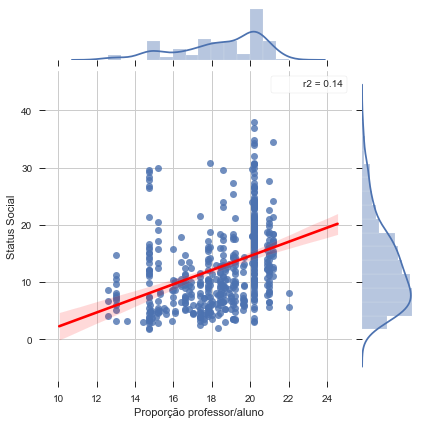

In [156]:
# Gráfico de de correlação
sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})

sns.jointplot(x='PTRATIO', y='LSTAT',  data=X, kind='reg', line_kws={'color':"red"}, stat_func=r2)
plt.xlabel('Proporção professor/aluno')
plt.ylabel('Status Social')
plt.grid(True)
plt.show()